In [17]:
import numpy as np
from random import randint
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from IPython.display import HTML

np.random.seed(42)

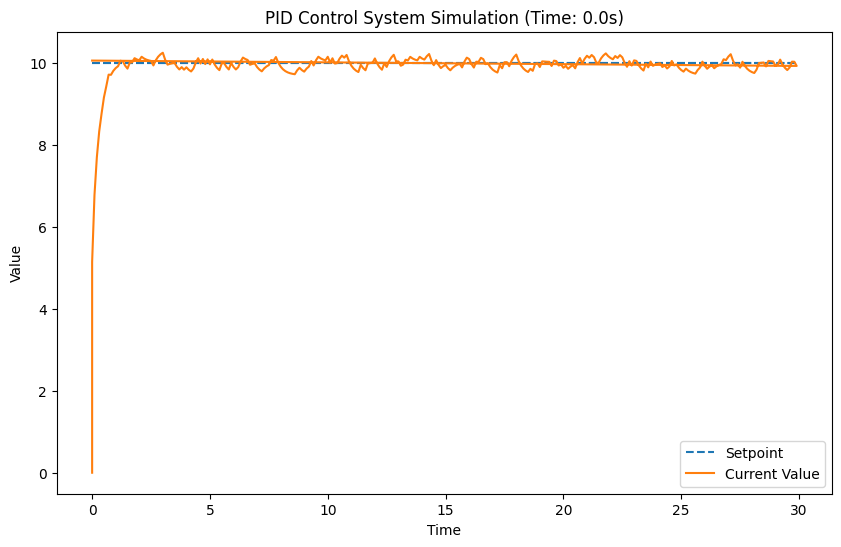

In [34]:
# PID controller parameters
Kp = 0.65  # Proportional gain
Ki = 0.02  # Integral gain
Kd = 0.25  # Derivative gain

# Simulation parameters
dt = 0.1  # Time step
t_max = 30  # Maximum simulation time

# Initial conditions
setpoint = 10.0
current_value = 0.0
integral = 0.0
derivative = 0.0

# Disturbance
def disturbance():
    return randint(-1, 1) / 10

# Arrays to store data for plotting
time_values = [0]
setpoint_values = [setpoint]
current_values = [current_value]

# Set up the figure and axis
fig, ax = plt.subplots(figsize=(10, 6))
line_setpoint, = ax.plot(time_values, setpoint_values, label='Setpoint', linestyle='--')
line_current, = ax.plot(time_values, current_values, label='Current Value')

ax.set_title('PID Control System Simulation')
ax.set_xlabel('Time')
ax.set_ylabel('Value')
ax.legend()

# Animation function
def animate(frame):
    global current_value, integral, derivative

    # PID control calculation
    error = setpoint - current_value
    integral += error * dt
    derivative = (error - (current_values[-1] - current_value)) / dt
    control_output = Kp * error + Ki * integral + Kd * derivative

    # Update the current value with the control output
    turb = disturbance()
    current_value += (control_output * dt + turb)

    # Store data for plotting
    time_values.append(frame * dt)
    setpoint_values.append(setpoint)
    current_values.append(current_value)

    # Update plot data
    line_setpoint.set_data(time_values, setpoint_values)
    line_current.set_data(time_values, current_values)

    ax.relim()
    ax.autoscale_view()

    ax.set_title(f'PID Control System Simulation (Time: {frame * dt:.1f}s)')
    return line_setpoint, line_current

# Create the animation
num_frames = int(t_max / dt)
animation = FuncAnimation(fig, animate, frames=num_frames, interval=100, repeat=False)

HTML(animation.to_jshtml())